In [1]:
!nvidia-smi

Tue Mar 25 14:38:11 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   32C    P0             28W /  250W |       0MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/kaggle/working


In [3]:
!pip install -q git+https://github.com/THU-MIG/yolov10.git

In [4]:
!pip install -q supervision roboflow

In [5]:
pip install --upgrade ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 34.7 MB/s eta 0:00:00
  Attempting uninstall: ultralytics
    Found existing installation: ultralytics 8.1.34
    Uninstalling ultralytics-8.1.34:
      Successfully uninstalled ultralytics-8.1.34
Note: you may need to restart the kernel to use updated packages.


In [6]:
!mkdir -p {HOME}/weights
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10n.pt
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10s.pt
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10m.pt
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10b.pt
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10x.pt
!wget -P {HOME}/weights -q https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10l.pt
!ls -lh {HOME}/weights

total 408M
-rw-r--r-- 1 root root  80M May 26  2024 yolov10b.pt
-rw-r--r-- 1 root root 100M May 26  2024 yolov10l.pt
-rw-r--r-- 1 root root  64M May 26  2024 yolov10m.pt
-rw-r--r-- 1 root root  11M May 26  2024 yolov10n.pt
-rw-r--r-- 1 root root  32M May 26  2024 yolov10s.pt
-rw-r--r-- 1 root root 123M May 26  2024 yolov10x.pt


In [7]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="jzSwnJSLa16yiXXfFpxk")
project = rf.workspace("trabalho-ia-1mqpa").project("ia-sevif")
version = project.version(3)
dataset = version.download("yolov8")



loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to IA-3 in yolov8:: 100%|██████████| 3808/3808 [00:00<00:00, 8620.79it/s]


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [8]:
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!echo -e "test: ../test/images\ntrain: ../train/images\nval: ../valid/images" >> {dataset.location}/data.yaml

In [9]:
# Printar os caminhos antes de adicionar
!echo "test: ../test/images"
!echo "train: ../train/images"
!echo "val: ../valid/images"

# Modificar o arquivo conforme desejado
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!echo -e "test: ../test/images\ntrain: ../train/images\nval: ../valid/images" >> {dataset.location}/data.yaml


test: ../test/images
train: ../train/images
val: ../valid/images


In [10]:
import os
os.environ["WANDB_MODE"] = "disabled"
!yolo task=detect mode=train epochs=20 batch=4 plots=True \
model={HOME}/weights/yolov10x.pt \
data={dataset.location}/data.yaml \
optimizer=AdamW lr0=0.00005

Ultralytics 8.3.96 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=/kaggle/working/weights/yolov10x.pt, data=/kaggle/working/IA-3/data.yaml, epochs=20, time=None, patience=100, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labe

In [11]:
!ls {HOME}/runs/detect/train/

F1_curve.png					   train_batch1.jpg
PR_curve.png					   train_batch2.jpg
P_curve.png					   train_batch4340.jpg
R_curve.png					   train_batch4341.jpg
args.yaml					   train_batch4342.jpg
confusion_matrix.png				   val_batch0_labels.jpg
confusion_matrix_normalized.png			   val_batch0_pred.jpg
events.out.tfevents.1742913599.d70249a89ea7.149.0  val_batch1_labels.jpg
labels.jpg					   val_batch1_pred.jpg
labels_correlogram.jpg				   val_batch2_labels.jpg
results.csv					   val_batch2_pred.jpg
results.png					   weights
train_batch0.jpg


In [12]:
# Instalar Ultralytics.
from ultralytics import YOLO

# Carregar o modelo YOLOv10n.
model = YOLO( "/kaggle/working/runs/detect/train/weights/best.pt" )

# Exportar o modelo para o formato LiteRT (TF Lite).
model.export( format = "tflite" )

Ultralytics 8.3.96 🚀 Python-3.10.14 torch-2.4.0 CPU (Intel Xeon 2.00GHz)
YOLOv10x summary (fused): 215 layers, 31,587,932 parameters, 0 gradients, 169.8 GFLOPs

PyTorch: starting from '/kaggle/working/runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 300, 6) (61.1 MB)
requirements: Ultralytics requirements ['sng4onnx>=1.0.1', 'onnx_graphsurgeon>=0.3.26', 'ai-edge-litert>=1.2.0', 'onnx2tf>=1.26.3', 'onnxslim>=0.1.31', 'tflite_support', 'onnxruntime', 'protobuf>=5'] not found, attempting AutoUpdate...


ERROR: Cannot install protobuf>=5 and tflite-support==0.4.4 because these package versions have conflicting dependencies.
ERROR: ResolutionImpossible: for help visit https://pip.pypa.io/en/latest/topics/dependency-resolution/#dealing-with-dependency-conflicts


Retry 1/2 failed: Command 'pip install --no-cache-dir "sng4onnx>=1.0.1" "onnx_graphsurgeon>=0.3.26" "ai-edge-litert>=1.2.0" "onnx2tf>=1.26.3" "onnxslim>=0.1.31" "tflite_support" "onnxruntime" "protobuf>=5" --extra-index-url https://pypi.ngc.nvidia.com' returned non-zero exit status 1.


ERROR: Cannot install protobuf>=5 and tflite-support==0.4.4 because these package versions have conflicting dependencies.
ERROR: ResolutionImpossible: for help visit https://pip.pypa.io/en/latest/topics/dependency-resolution/#dealing-with-dependency-conflicts


Retry 2/2 failed: Command 'pip install --no-cache-dir "sng4onnx>=1.0.1" "onnx_graphsurgeon>=0.3.26" "ai-edge-litert>=1.2.0" "onnx2tf>=1.26.3" "onnxslim>=0.1.31" "tflite_support" "onnxruntime" "protobuf>=5" --extra-index-url https://pypi.ngc.nvidia.com' returned non-zero exit status 1.
requirements: ❌ Command 'pip install --no-cache-dir "sng4onnx>=1.0.1" "onnx_graphsurgeon>=0.3.26" "ai-edge-litert>=1.2.0" "onnx2tf>=1.26.3" "onnxslim>=0.1.31" "tflite_support" "onnxruntime" "protobuf>=5" --extra-index-url https://pypi.ngc.nvidia.com' returned non-zero exit status 1.

TensorFlow SavedModel: starting export with tensorflow 2.16.1...
TensorFlow SavedModel: export failure ❌ 21.5s: No module named 'onnx2tf'


ModuleNotFoundError: No module named 'onnx2tf'

In [13]:
import shutil

# Caminho da pasta que você quer compactar
pasta_origem = '/kaggle/working/runs/detect/train/weights/best_saved_model'

# Caminho de destino do arquivo compactado
arquivo_destino = '/kaggle/working/tetes'

# Compactando a pasta em um arquivo ZIP
shutil.make_archive(arquivo_destino, 'zip', pasta_origem)

print(f'Pasta compactada com sucesso em {arquivo_destino}.zip')


Pasta compactada com sucesso em /kaggle/working/tetes.zip



0: 640x640 4 rusts, 1327.6ms
Speed: 2.1ms preprocess, 1327.6ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


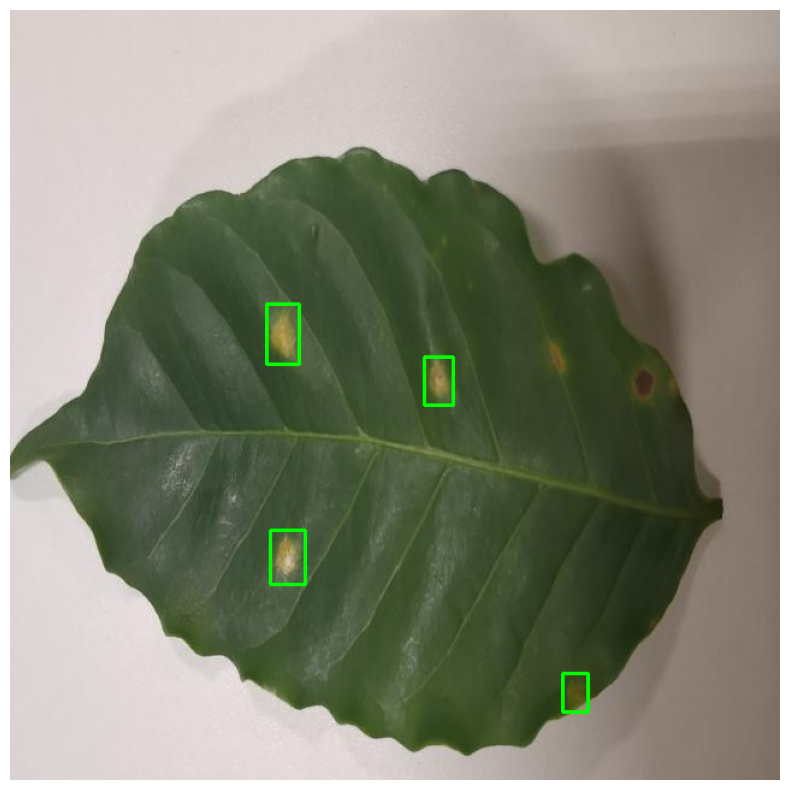

In [14]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# 1. Carregar o modelo pré-treinado YOLO
model = YOLO('/kaggle/working/runs/detect/train/weights/last.pt')  # Modelo YOLOv8

# 2. Carregar uma imagem
image_path = "/kaggle/working/IA-3/test/images/name94_jpg.rf.9bd091051e3f6b848d5e70b46b9e63d4.jpg"  # Substitua pelo caminho correto
image = cv2.imread(image_path)

# 3. Fazer inferência
results = model(image, conf=0.3)  # Ajuste o limiar de confiança, se necessário

# 4. Desenhar as caixas sem nomes das classes
annotated_image = image.copy()
for result in results[0].boxes:
    box = result.xyxy[0]  # Coordenadas da caixa [x_min, y_min, x_max, y_max]
    conf = result.conf[0]  # Confiança da detecção
    x_min, y_min, x_max, y_max = map(int, box)

    # Desenhar apenas as caixas na imagem
    color = (0, 255, 0)  # Cor da caixa (verde)
    cv2.rectangle(annotated_image, (x_min, y_min), (x_max, y_max), color, 2)

# 5. Mostrar a imagem sem nomes de classes
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))  # Converter para RGB antes de exibir
plt.axis('off')
plt.show()



0: 640x640 5 leaf miners, 1331.4ms
Speed: 2.2ms preprocess, 1331.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


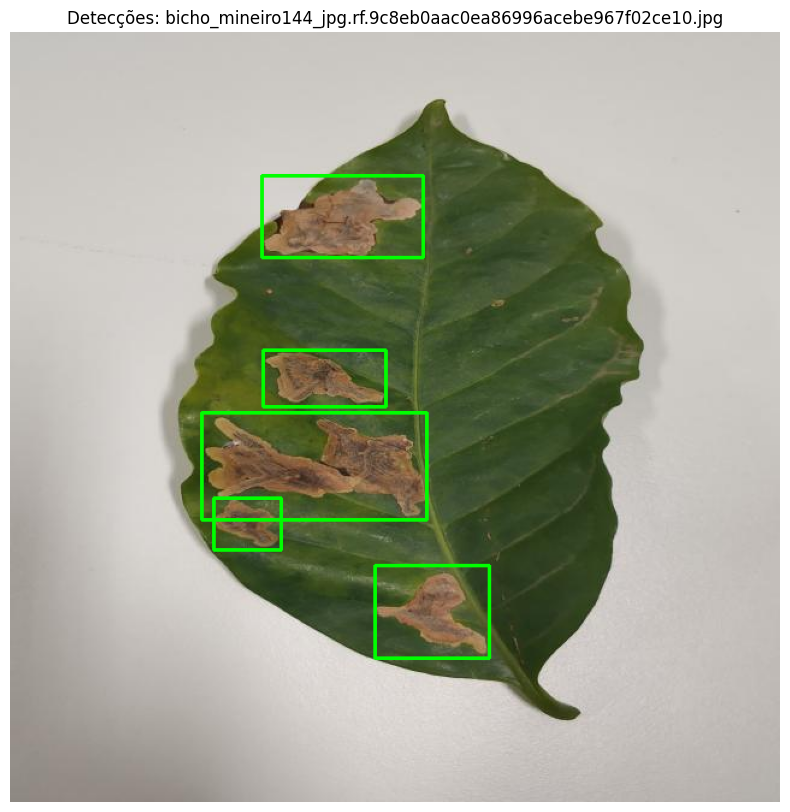


0: 640x640 6 rusts, 1314.4ms
Speed: 3.2ms preprocess, 1314.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


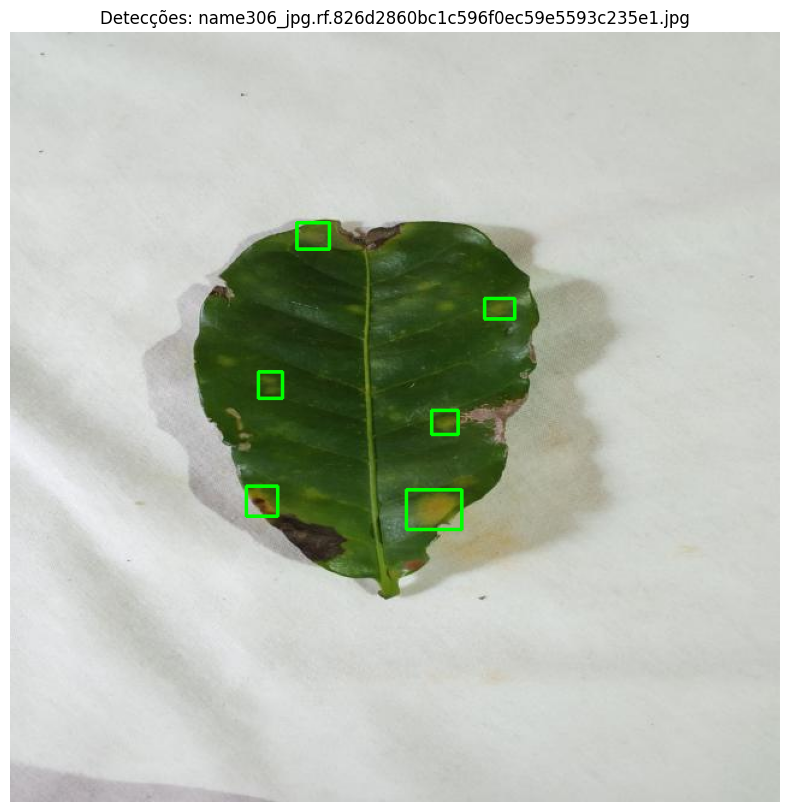


0: 640x640 4 leaf miners, 1400.8ms
Speed: 1.7ms preprocess, 1400.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


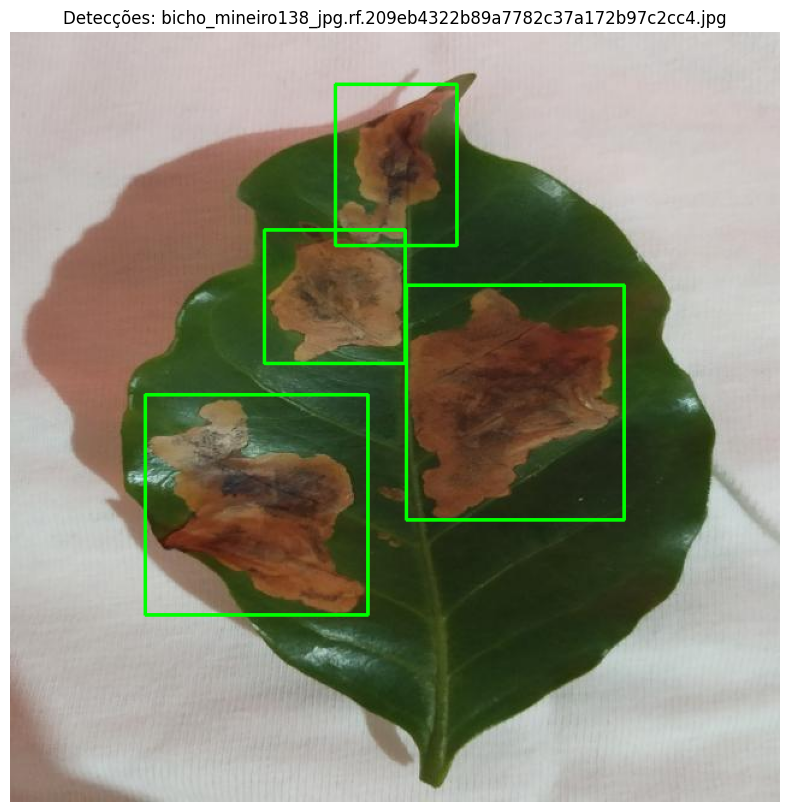


0: 640x640 7 leaf miners, 10 rusts, 1350.4ms
Speed: 2.5ms preprocess, 1350.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


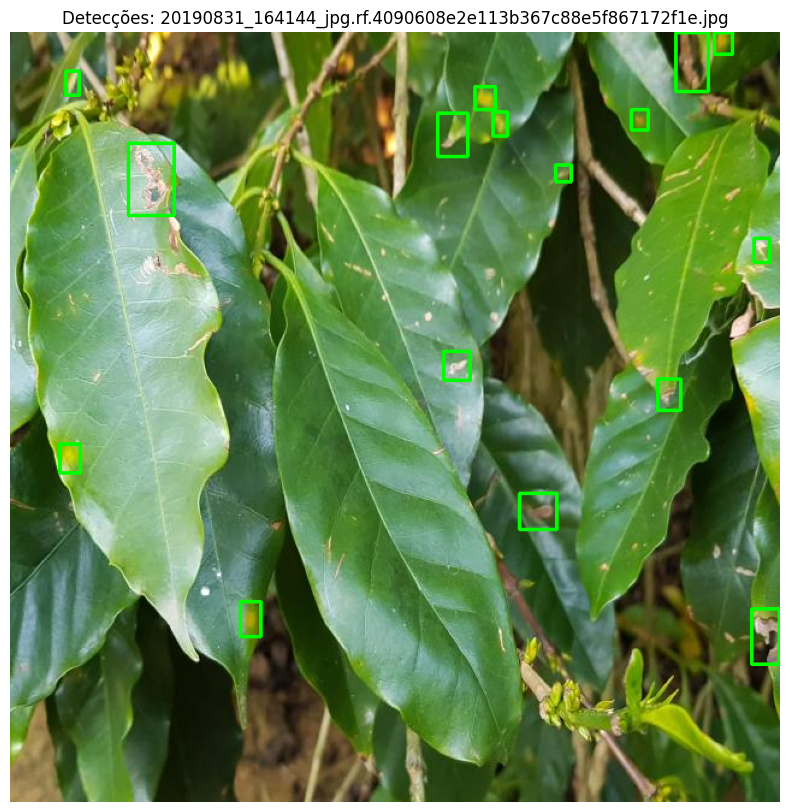


0: 640x640 4 rusts, 1319.8ms
Speed: 1.7ms preprocess, 1319.8ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


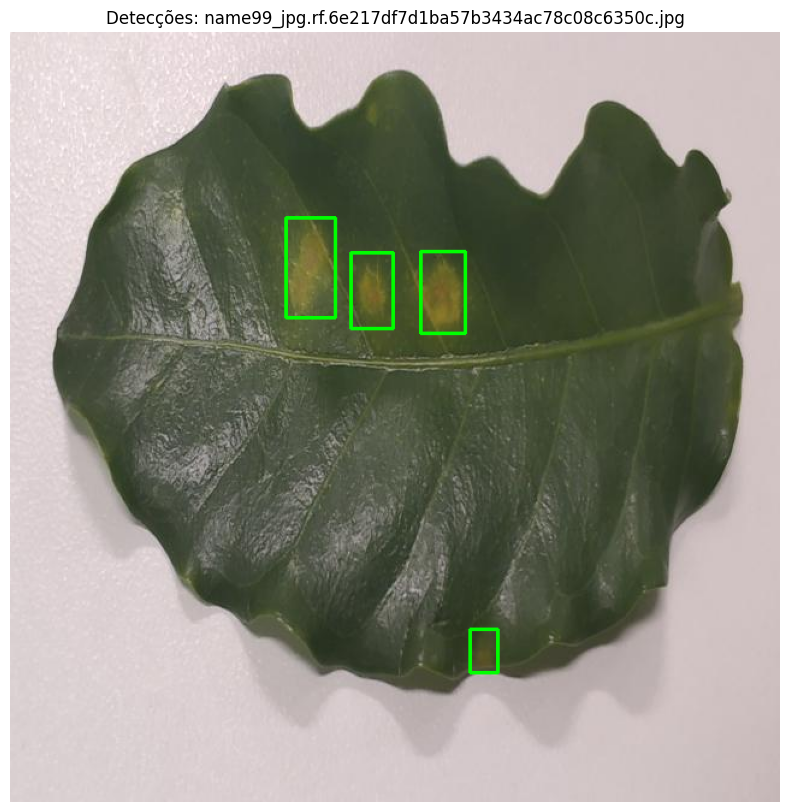


0: 640x640 6 leaf miners, 2 rusts, 1279.0ms
Speed: 1.9ms preprocess, 1279.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


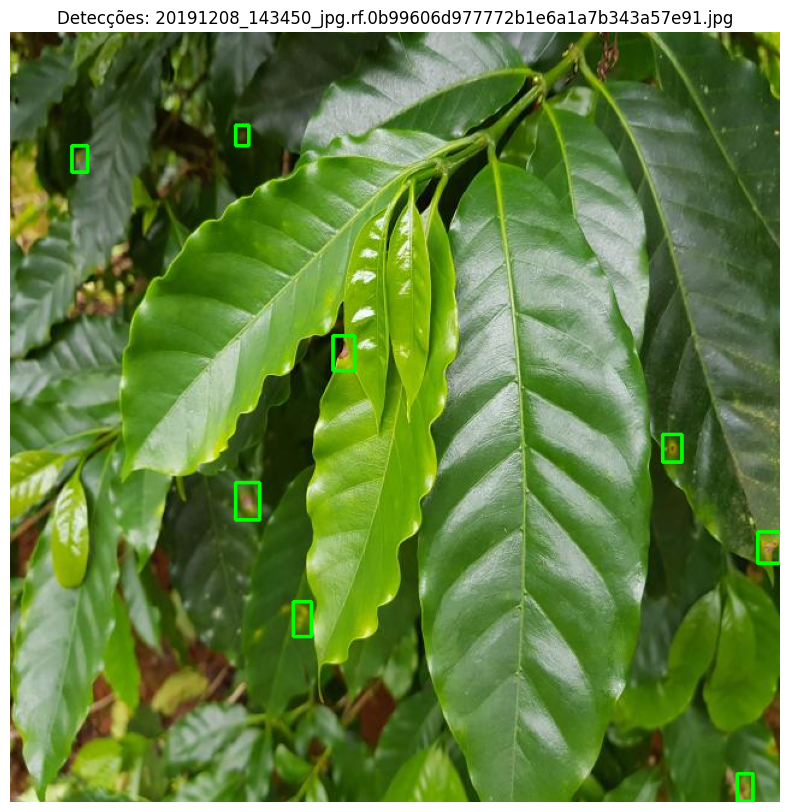


0: 640x640 6 leaf miners, 2 rusts, 1276.1ms
Speed: 1.8ms preprocess, 1276.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


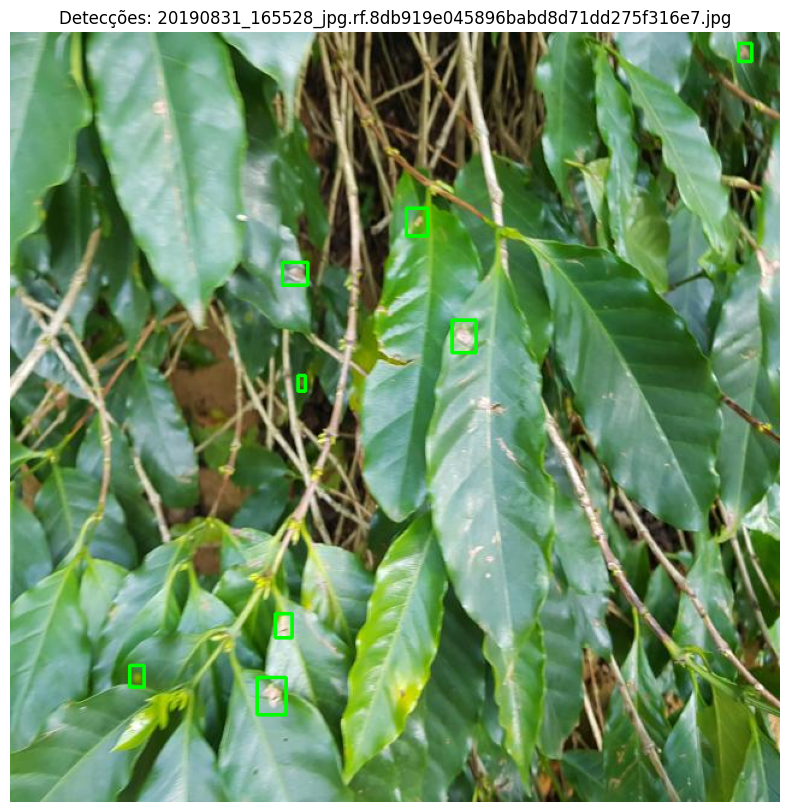


0: 640x640 5 rusts, 1338.4ms
Speed: 1.8ms preprocess, 1338.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


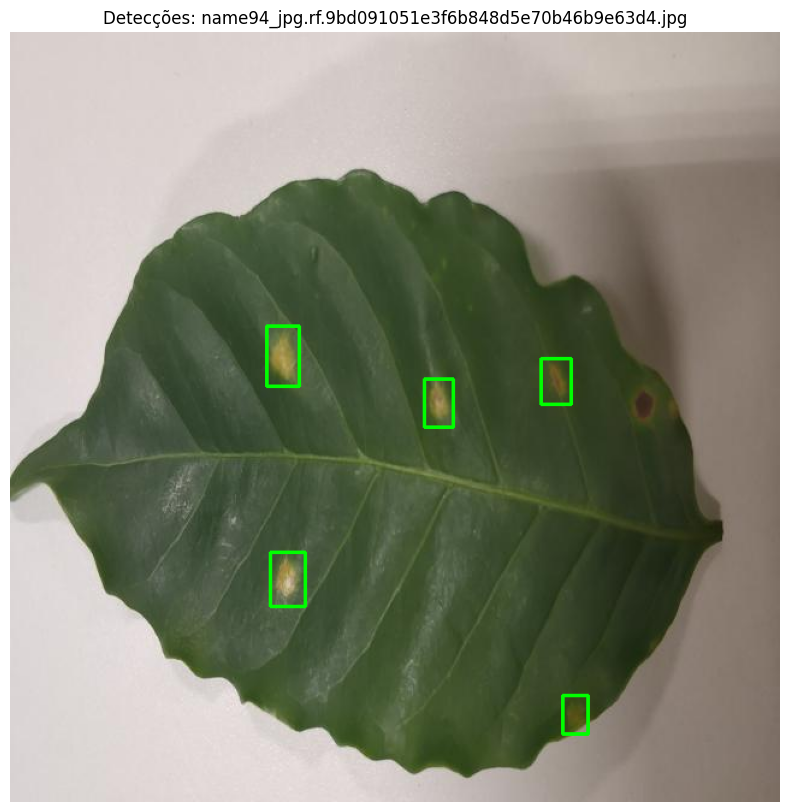


0: 640x640 17 leaf miners, 1 rust, 1329.7ms
Speed: 1.8ms preprocess, 1329.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


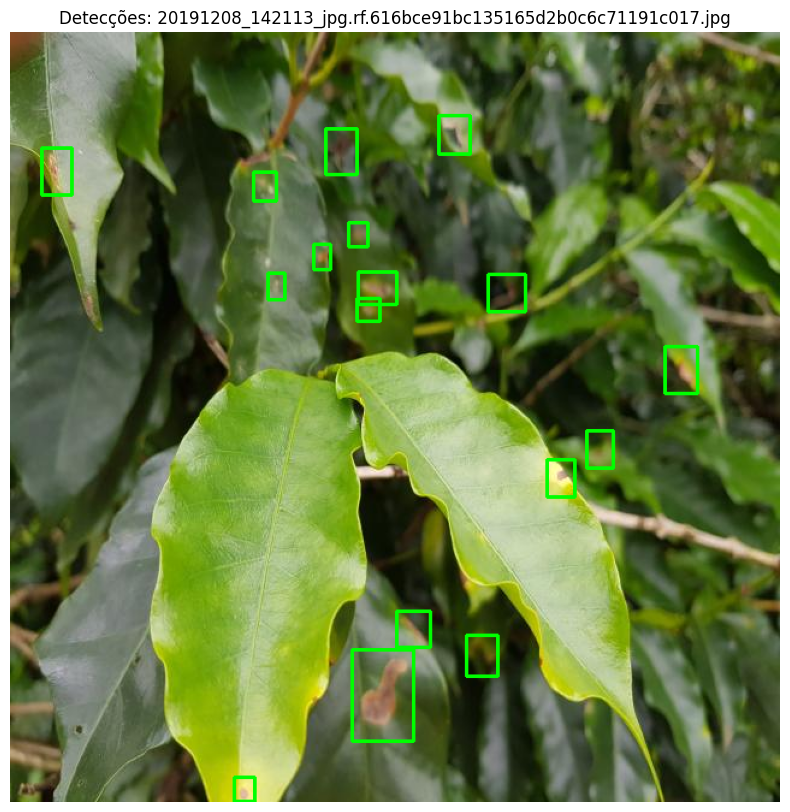


0: 640x640 22 leaf miners, 6 rusts, 1292.5ms
Speed: 1.9ms preprocess, 1292.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


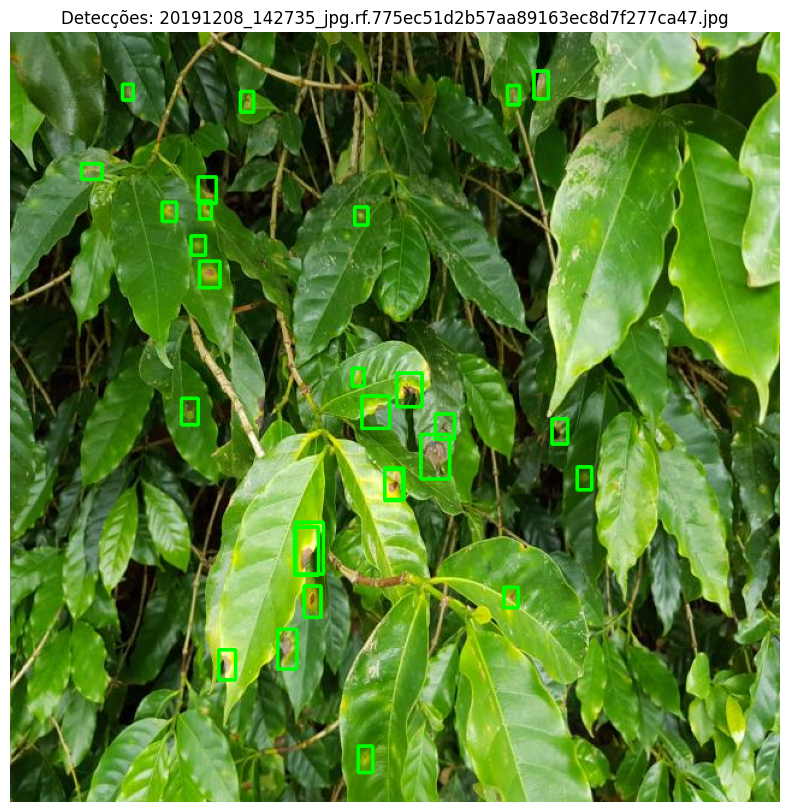


0: 640x640 4 leaf miners, 1294.2ms
Speed: 1.7ms preprocess, 1294.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


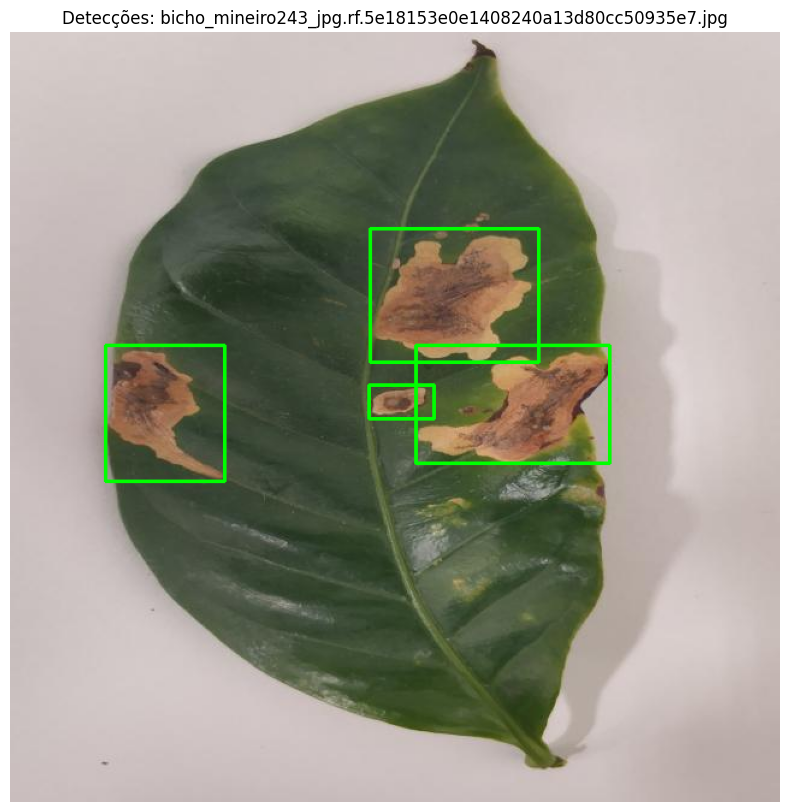


0: 640x640 1 leaf miner, 11 rusts, 1312.1ms
Speed: 1.8ms preprocess, 1312.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


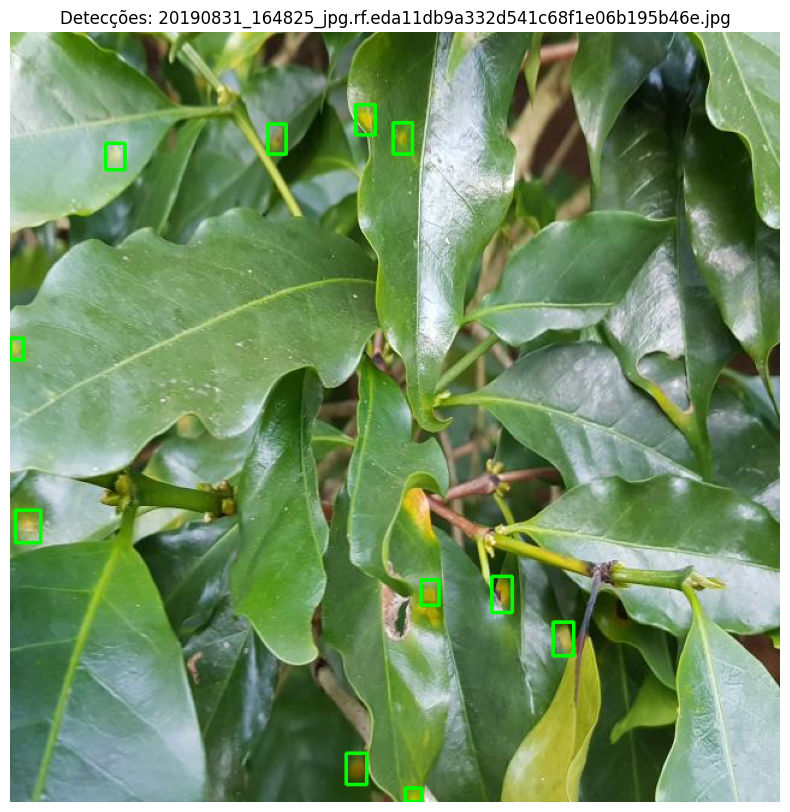


0: 640x640 6 leaf miners, 1342.0ms
Speed: 1.7ms preprocess, 1342.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


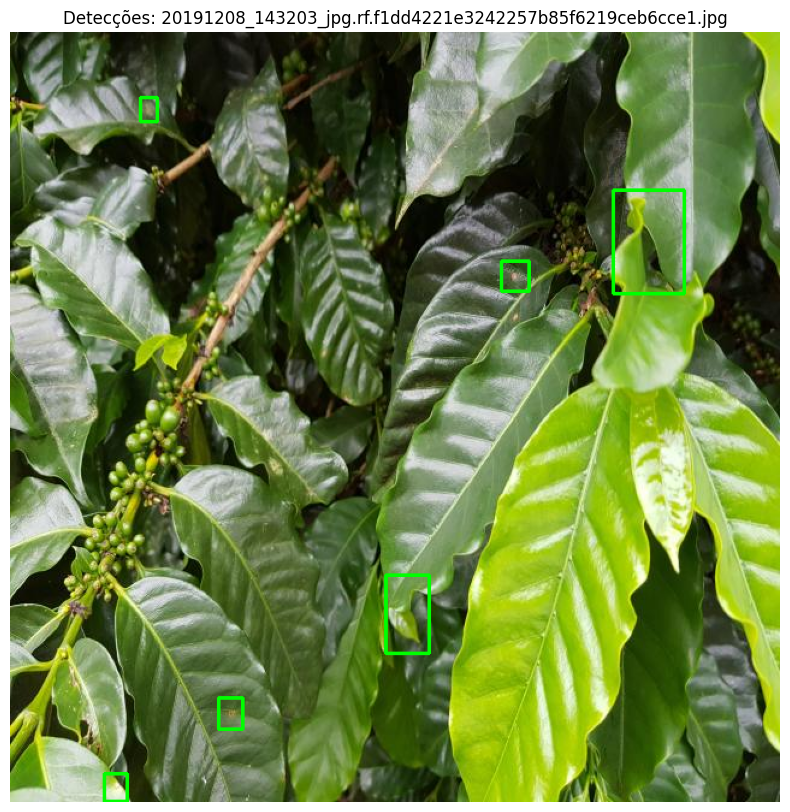


0: 640x640 29 leaf miners, 1 rust, 1238.3ms
Speed: 2.4ms preprocess, 1238.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


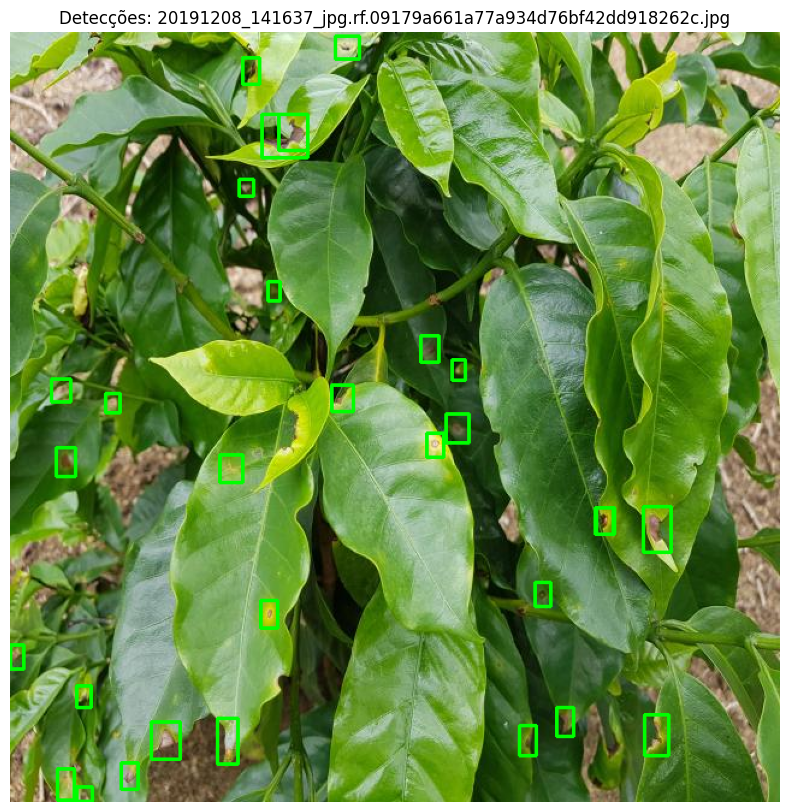


0: 640x640 8 leaf miners, 1249.7ms
Speed: 1.7ms preprocess, 1249.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


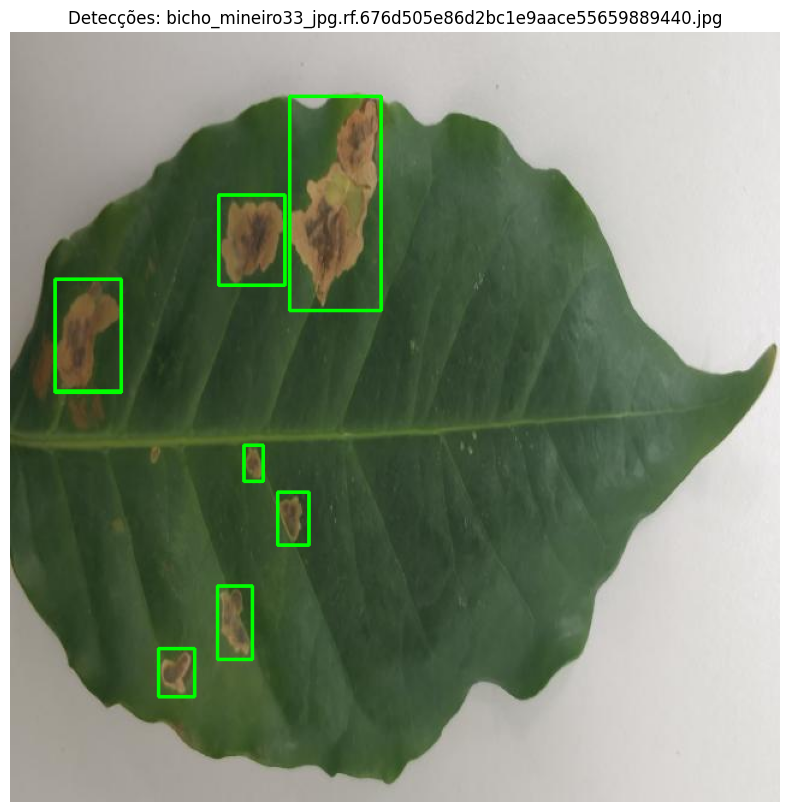


0: 640x640 12 leaf miners, 2 rusts, 1275.4ms
Speed: 1.9ms preprocess, 1275.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


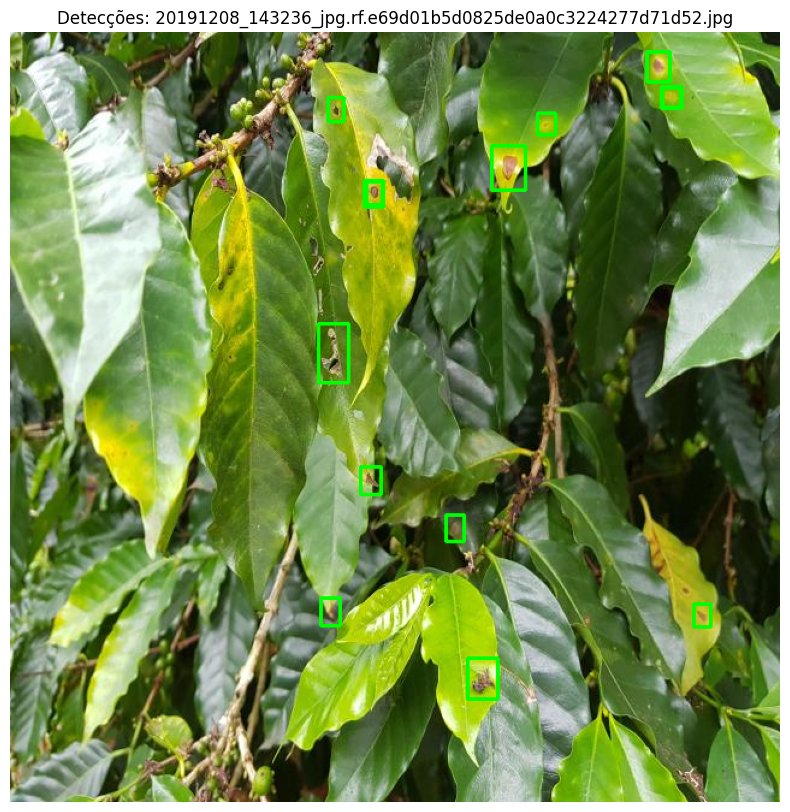


0: 640x640 3 rusts, 1239.7ms
Speed: 1.7ms preprocess, 1239.7ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


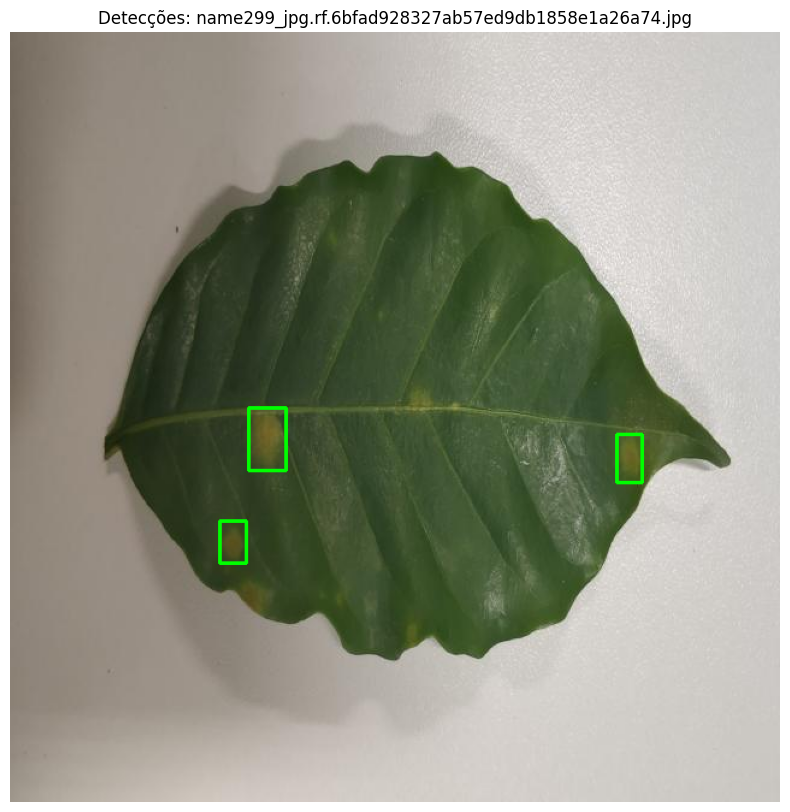


0: 640x640 5 rusts, 1195.1ms
Speed: 2.4ms preprocess, 1195.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


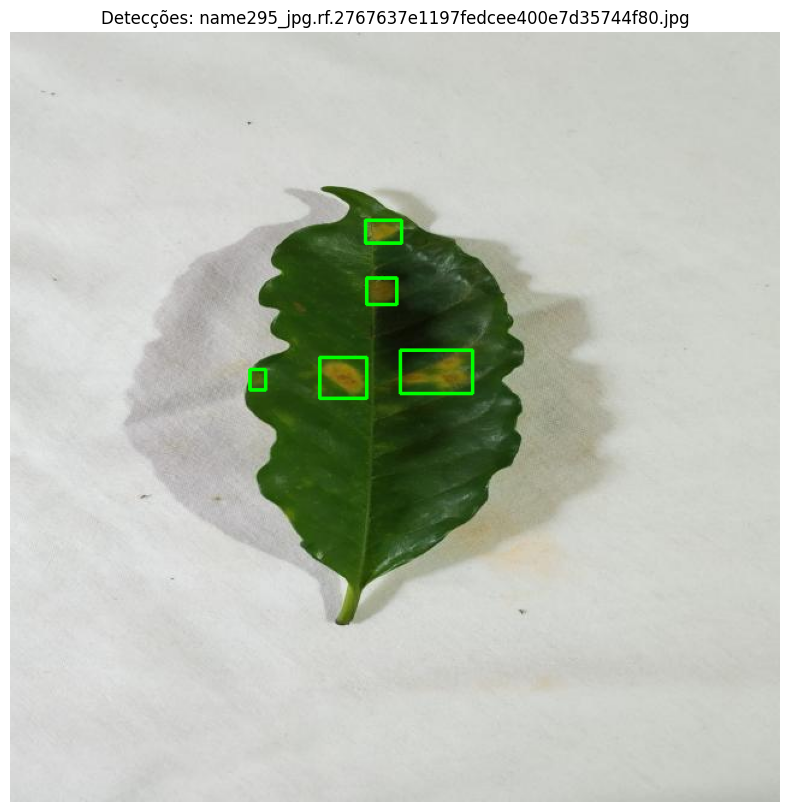


0: 640x640 7 leaf miners, 1265.5ms
Speed: 1.9ms preprocess, 1265.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


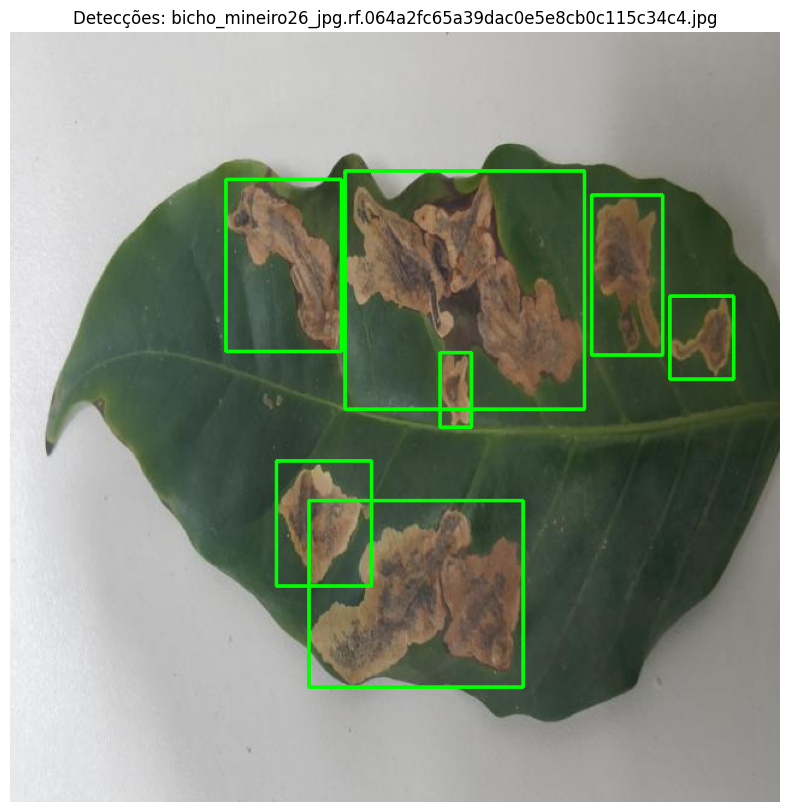


0: 640x640 22 leaf miners, 27 rusts, 1179.1ms
Speed: 2.0ms preprocess, 1179.1ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


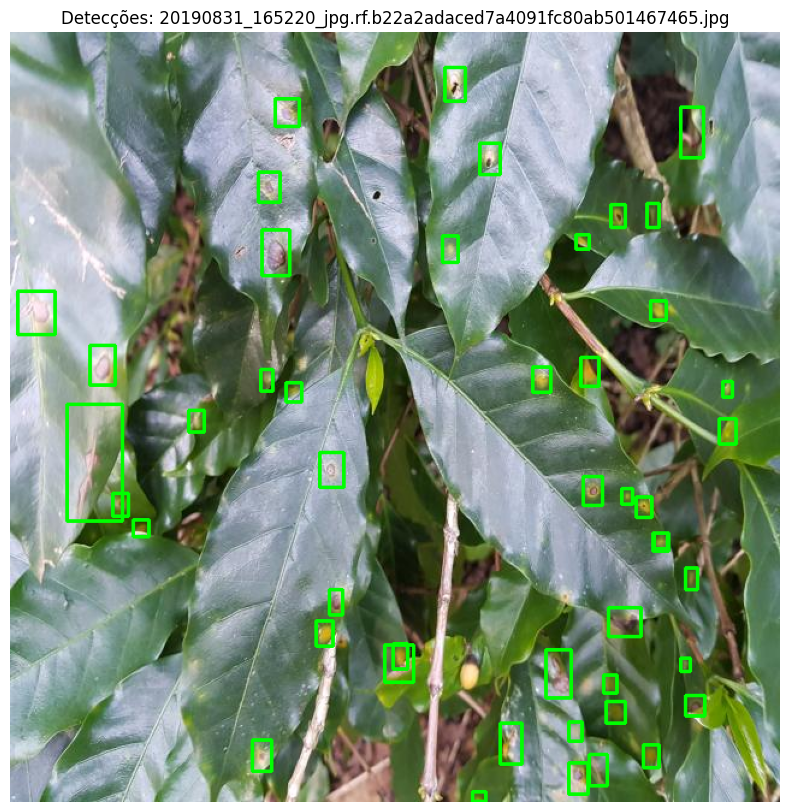


0: 640x640 11 rusts, 1324.8ms
Speed: 2.3ms preprocess, 1324.8ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


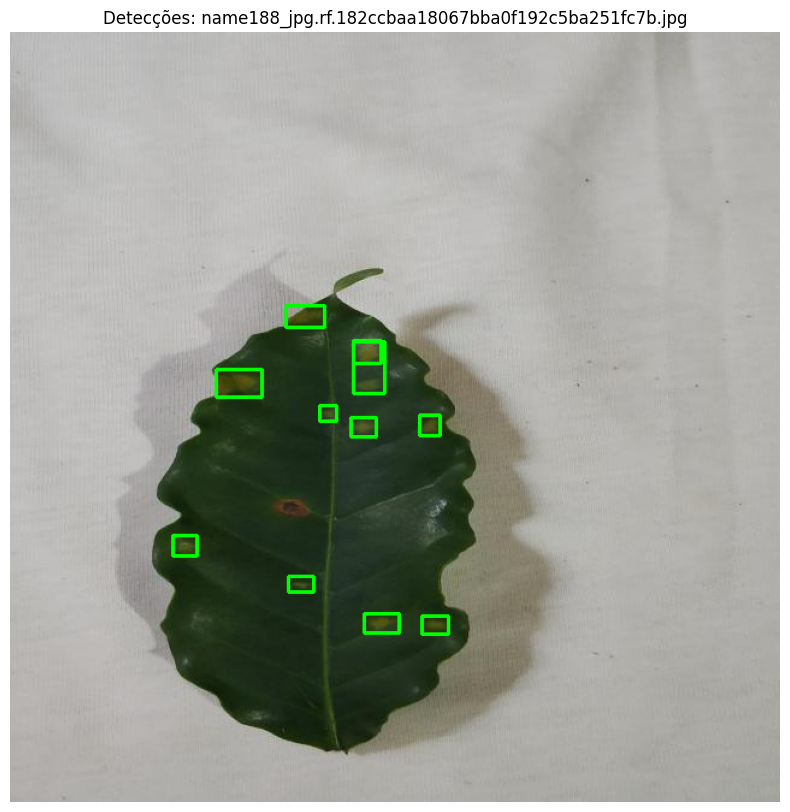

In [15]:
import os
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# 1. Carregar o modelo pré-treinado YOLO
model = YOLO('/kaggle/working/runs/detect/train/weights/last.pt')  # Modelo YOLOv8

# 2. Caminho da pasta contendo as imagens
folder_path = "/kaggle/working/IA-3/test/images"  # Substitua pelo caminho correto

# 3. Listar todas as imagens na pasta
image_extensions = ['.jpg', '.jpeg', '.png', '.bmp']  # Extensões de imagens suportadas
image_files = [f for f in os.listdir(folder_path) if os.path.splitext(f)[-1].lower() in image_extensions]

# 4. Processar cada imagem
for image_file in image_files:
    image_path = os.path.join(folder_path, image_file)
    image = cv2.imread(image_path)

    if image is None:
        print(f"Erro ao carregar a imagem: {image_path}")
        continue

    # 5. Fazer inferência
    results = model(image, conf=0.2)  # Ajuste o limiar de confiança, se necessário

    # 6. Desenhar as caixas sem nomes das classes
    annotated_image = image.copy()
    for result in results[0].boxes:
        box = result.xyxy[0]  # Coordenadas da caixa [x_min, y_min, x_max, y_max]
        x_min, y_min, x_max, y_max = map(int, box)

        # Desenhar apenas as caixas na imagem
        color = (0, 255, 0)  # Cor da caixa (verde)
        cv2.rectangle(annotated_image, (x_min, y_min), (x_max, y_max), color, 2)

    # 7. Mostrar a imagem sem nomes de classes
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))  # Converter para RGB antes de exibir
    plt.title(f"Detecções: {image_file}")
    plt.axis('off')
    plt.show()


In [16]:
import os
import zipfile
from ultralytics import YOLO
import cv2

# 1. Carregar o modelo pré-treinado YOLO
model = YOLO('/kaggle/working/runs/detect/train/weights/last.pt')  # Modelo YOLOv8

# 2. Caminho da pasta contendo as imagens
input_folder_path = "/kaggle/working/IA-3/test/images"  # Substitua pelo caminho correto
output_folder_path = "/kaggle/working/processed_images"  # Pasta para salvar as imagens processadas

# 3. Criar a pasta de saída, se não existir
os.makedirs(output_folder_path, exist_ok=True)

# 4. Listar todas as imagens na pasta
image_extensions = ['.jpg', '.jpeg', '.png', '.bmp']  # Extensões de imagens suportadas
image_files = [f for f in os.listdir(input_folder_path) if os.path.splitext(f)[-1].lower() in image_extensions]

# 5. Processar cada imagem
for image_file in image_files:
    image_path = os.path.join(input_folder_path, image_file)
    image = cv2.imread(image_path)

    if image is None:
        print(f"Erro ao carregar a imagem: {image_path}")
        continue

    # Fazer inferência
    results = model(image, conf=0.2)  # Ajuste o limiar de confiança, se necessário

    # Desenhar as caixas sem nomes das classes
    annotated_image = image.copy()
    for result in results[0].boxes:
        box = result.xyxy[0]  # Coordenadas da caixa [x_min, y_min, x_max, y_max]
        x_min, y_min, x_max, y_max = map(int, box)

        # Desenhar apenas as caixas na imagem
        color = (0, 255, 0)  # Cor da caixa (verde)
        cv2.rectangle(annotated_image, (x_min, y_min), (x_max, y_max), color, 2)

    # Salvar a imagem anotada na pasta de saída
    output_image_path = os.path.join(output_folder_path, image_file)
    cv2.imwrite(output_image_path, annotated_image)

# 6. Compactar a pasta de saída em um arquivo ZIP
zip_file_path = "/kaggle/working/processed_images.zip"  # Caminho do arquivo ZIP
with zipfile.ZipFile(zip_file_path, 'w') as zipf:
    for root, dirs, files in os.walk(output_folder_path):
        for file in files:
            file_path = os.path.join(root, file)
            arcname = os.path.relpath(file_path, output_folder_path)
            zipf.write(file_path, arcname)

print(f"Imagens processadas foram salvas e compactadas em: {zip_file_path}")



0: 640x640 5 leaf miners, 1350.4ms
Speed: 2.0ms preprocess, 1350.4ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 6 rusts, 1268.5ms
Speed: 2.1ms preprocess, 1268.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 4 leaf miners, 1269.4ms
Speed: 2.0ms preprocess, 1269.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 7 leaf miners, 10 rusts, 1312.0ms
Speed: 3.0ms preprocess, 1312.0ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 4 rusts, 1315.4ms
Speed: 2.1ms preprocess, 1315.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 6 leaf miners, 2 rusts, 1314.2ms
Speed: 2.0ms preprocess, 1314.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 6 leaf miners, 2 rusts, 1363.3ms
Speed: 2.2ms preprocess, 1363.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 5 rusts, 1353.8ms
Speed: 2.

In [17]:
pip install pyyaml


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


Note: you may need to restart the kernel to use updated packages.


In [18]:
import yaml

# Defina o caminho do arquivo YAML
yaml_file_path = "/kaggle/working/IA-3/data.yaml"

# Carregar o arquivo YAML
with open(yaml_file_path, 'r') as file:
    data = yaml.safe_load(file)

# Modificar os dados carregados (adicione ou altere os campos desejados)
data['test'] = '../test/images'
data['train'] = '../train/images'
data['val'] = '../test/images'

# Escrever as modificações de volta no arquivo YAML
with open(yaml_file_path, 'w') as file:
    yaml.dump(data, file, default_flow_style=False)

print(f"Arquivo {yaml_file_path} atualizado com sucesso.")


Arquivo /kaggle/working/IA-3/data.yaml atualizado com sucesso.


In [20]:
!yolo mode=val model=/kaggle/working/runs/detect/train/weights/last.pt data=/kaggle/working/IA-3/data.yaml

Ultralytics 8.3.96 🚀 Python-3.10.14 torch-2.4.0 CPU (Intel Xeon 2.00GHz)
YOLOv10x summary (fused): 215 layers, 31,587,932 parameters, 0 gradients, 169.8 GFLOPs
val: Scanning /kaggle/working/IA-3/test/labels.cache... 21 images, 0 backgrounds
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 10, len(boxes) = 311. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all         21        311      0.539      0.422        0.4      0.136
            leaf miner         17        217      0.613      0.419      0.442      0.156
                  rust         13         94      0.464      0.426      0.357      0.117
Speed: 4.0ms preprocess, 2241.0ms inference, 0.0ms loss, 0.1ms postprocess per image
Results saved to runs/detect/val2
💡 Learn more at https